In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder

In [41]:
# Configure pandas to display all columns
pd.set_option("display.max_columns", None)

In [42]:
df_cluster = pd.read_csv('bank_marketing_dataset.csv')

In [43]:
numerical_cols_c = df_cluster.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df_cluster.select_dtypes(include=['object']).columns
duration_col = ['duration']  # Column to log transform

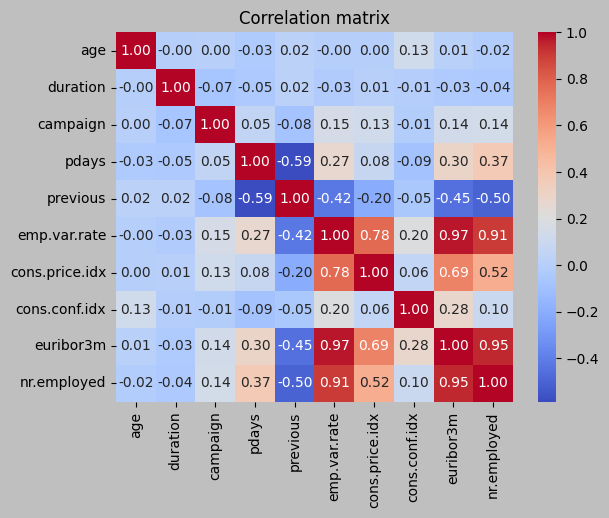

In [326]:
# Correlation matrix
corr = df_cluster[numerical_cols_c].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation matrix")
plt.show()

In [81]:
X_preprocessed_df = df_cluster.copy()
X_preprocessed_df['duration'] = np.log1p(df_cluster['duration'])

scaler = StandardScaler()
X_preprocessed_df[numerical_cols_c] = scaler.fit_transform(X_preprocessed_df[numerical_cols_c])

encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
X_cat_encoded = pd.DataFrame(encoder.fit_transform(X_preprocessed_df[categorical_cols]), 
                                   columns=encoder.get_feature_names_out(categorical_cols), 
                                   index=X_preprocessed_df.index)

X_no_encoded = X_preprocessed_df.copy()

X_preprocessed_df.drop(columns=categorical_cols, inplace=True)

X_preprocessed_df = pd.concat([X_preprocessed_df, X_cat_encoded], axis=1)

print(X_preprocessed_df.shape)

X_preprocessed_df.head()

(41188, 65)


c:\Users\valhk\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single,marital_unknown,education_basic.4y,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,education_unknown,default_no,default_unknown,default_yes,housing_no,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,contact_cellular,contact_telephone,month_apr,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,subscribed_no,subscribed_yes
0,1.533034,0.431124,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,1.628993,-0.177114,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,-0.290186,0.274738,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,-0.002309,-0.162669,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,1.533034,0.607534,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


# Testing GMM with only continuous columns

In [45]:
# Keeping only continuous variables
X_cluster = X_preprocessed_df.copy()

prefixes = ['job_', 'marital_', 'education_', 'default_', 'housing_', 'loan_', 'contact_', 'month_', 'day_of_week_', 'poutcome_', 'subscribed_']
one_hot_cols = [col for col in X_preprocessed_df.columns if any(col.startswith(prefix) for prefix in prefixes)]

# Keeping only one-hot encoded variables
X_cluster = X_preprocessed_df.drop(one_hot_cols, axis=1)

X_cluster.head()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,1.533034,0.431124,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168
1,1.628993,-0.177114,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168
2,-0.290186,0.274738,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168
3,-0.002309,-0.162669,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168
4,1.533034,0.607534,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.71246,0.33168


In [46]:
from sklearn.mixture import GaussianMixture         

from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score 
from kneed import KneeLocator 

In [47]:
silhouette = []
calinski_harabasz = []
davies_bouldin = []
for k in range(2,11):
    GMM = GaussianMixture (n_components = k , random_state = 1)
    GMM.fit (X_cluster)
    
    score = silhouette_score (X_cluster , GMM.predict(X_cluster))
    silhouette.append (score)
    
    score1 = calinski_harabasz_score (X_cluster, GMM.predict(X_cluster))
    calinski_harabasz.append(score1)
    
    score2 = davies_bouldin_score (X_cluster, GMM.predict(X_cluster))
    davies_bouldin.append (score2)

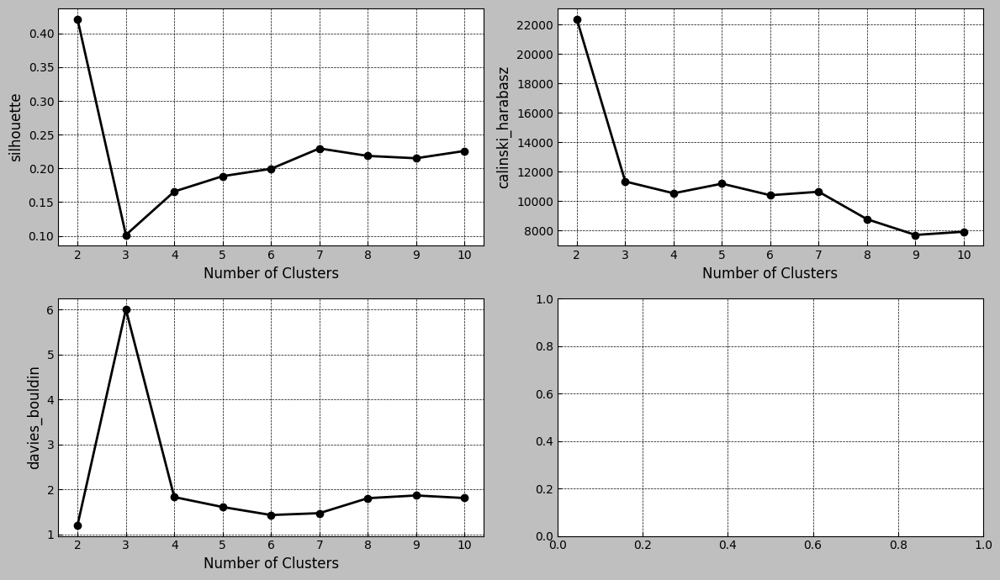

In [48]:
plt.style.use ('grayscale')
fig, axs = plt.subplots(2, 2, figsize=(12, 7))

metrics = {'silhouette': silhouette, 'calinski_harabasz': calinski_harabasz,
           'davies_bouldin': davies_bouldin}
metrics_list = list(metrics.items()) 

for i in range(2): 
    for j in range(2): 
        index = i*2 + j
        if index < len(metrics_list):
            metric_name, metric_values = metrics_list[i*2 + j] 
            axs[i, j].plot(range(2, 11), metric_values , marker = 'o')
            axs[i, j].set_xticks(range(2, 11))
            axs[i, j].set_xlabel('Number of Clusters')
            axs[i, j].set_ylabel(metric_name)
            axs[i, j].grid(True)

plt.tight_layout()
plt.show()

2 is the best choice here

In [49]:
silhouette = []
max_iter_values = range(90, 110, 1)
for i in max_iter_values:
    GMM = GaussianMixture(n_components = 2, random_state = 1, max_iter = i)
    GMM.fit(X_cluster)
    score = silhouette_score(X_cluster, GMM.predict(X_cluster))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_max_iter = pd.DataFrame(max_iter_values, columns=['max_iter'])
result = pd.concat([df_max_iter, df_silhouette], axis=1)
result

,max_iter,silhouette_score
0,90,0.421074
1,91,0.421074
2,92,0.421074
3,93,0.421074
4,94,0.421074
5,95,0.421074
6,96,0.421074
7,97,0.421074
8,98,0.421074
9,99,0.421074


Score does not change / evolve

In [50]:
result.max()

max_iter            109.000000
silhouette_score      0.421074
dtype: float64

In [51]:
silhouette = []
covariance_type_values = ['tied', 'diag', 'spherical', 'full']
for i in covariance_type_values:
    GMM = GaussianMixture(n_components = 2, random_state = 1, covariance_type = i)
    GMM.fit(X_cluster)
    score = silhouette_score(X_cluster, GMM.predict(X_cluster))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_covariance_type = pd.DataFrame(covariance_type_values, columns=['covariance_types'])
result = pd.concat([df_covariance_type, df_silhouette], axis=1)
result

,covariance_types,silhouette_score
0,tied,0.420902
1,diag,0.421105
2,spherical,0.383618
3,full,0.421074


Best silhouette score for diag

In [52]:
silhouette = []
n_init_values = range(1, 11, 1)
for i in n_init_values:
    GMM = GaussianMixture(n_components = 2, random_state = 1 , covariance_type = 'diag' , n_init = i)
    GMM.fit(X_cluster)
    score = silhouette_score(X_cluster, GMM.predict(X_cluster))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_n_init = pd.DataFrame(n_init_values, columns=['n_init'])
result = pd.concat([df_n_init, df_silhouette], axis=1)
result

,n_init,silhouette_score
0,1,0.421105
1,2,0.421105
2,3,0.421105
3,4,0.421105
4,5,0.421105
5,6,0.421105
6,7,0.421105
7,8,0.421105
8,9,0.421105
9,10,0.421105


n_init doesn't matter

In [53]:
silhouette = []
init_params_values = ['kmeans' , 'random', 'k-means++']
for i in init_params_values:
    GMM = GaussianMixture(n_components = 2, random_state = 1 , covariance_type = 'diag' ,
                          init_params = i)
    GMM.fit(X_cluster)
    score = silhouette_score(X_cluster, GMM.predict(X_cluster))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_init_params = pd.DataFrame(init_params_values, columns=['init_params'])
result = pd.concat([df_init_params, df_silhouette], axis=1)
result

,init_params,silhouette_score
0,kmeans,0.421105
1,random,0.353956
2,k-means++,0.421105


Default is kmeans

In [54]:
# all scores for best parameters
GMM = GaussianMixture (n_components = 2 , random_state = 1 , covariance_type = 'diag')
GMM.fit (X_cluster)
    
print ('silhouette_score : ' , silhouette_score (X_cluster , GMM.predict(X_cluster)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster, GMM.predict(X_cluster)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster, GMM.predict(X_cluster)))

silhouette_score :  0.4211047210390259
calinski_harabasz_score :  22379.38029530513
davies_bouldin_score :  1.2012019256177902


In [289]:
gmmV = df_cluster.copy ()
GMM = GaussianMixture (n_components = 2 , random_state = 1, covariance_type= 'diag' )
GMM.fit (X_cluster)
gmmV ['cluster'] = GMM.predict(X_cluster)

GMM_best = GMM

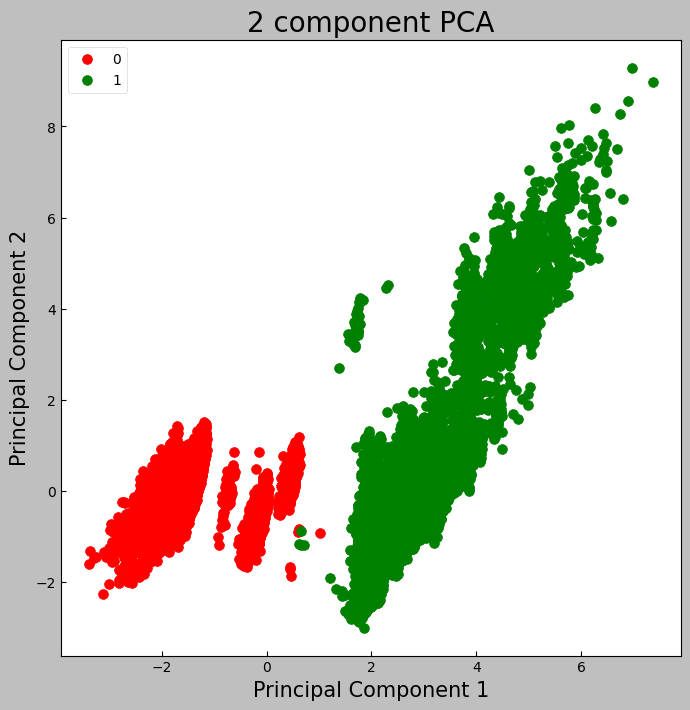

In [56]:
# Visualizing the clusters using PCA

from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

finalDf = pd.concat([principalDf, gmmV[['cluster']]], axis = 1)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0, 1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

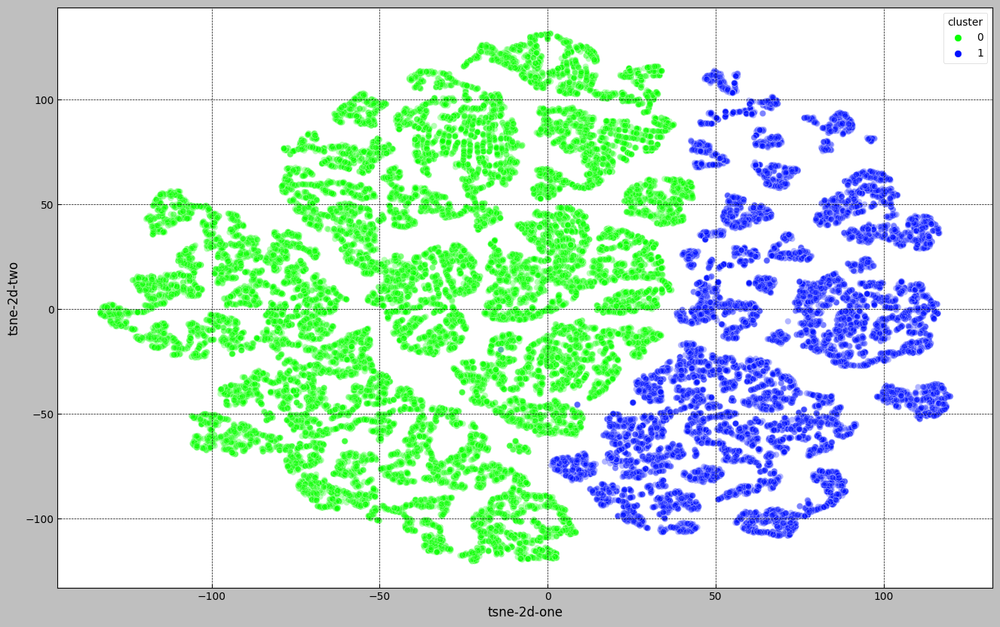

In [57]:
# Visualizing the clusters using t-SNE

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=1)
tsne_results = tsne.fit_transform(X_cluster)

gmmV['tsne-2d-one'] = tsne_results[:,0]
gmmV['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="cluster",
    palette=sns.color_palette("hsv", 2),
    data=gmmV,
    legend="full",
    alpha=0.3
)

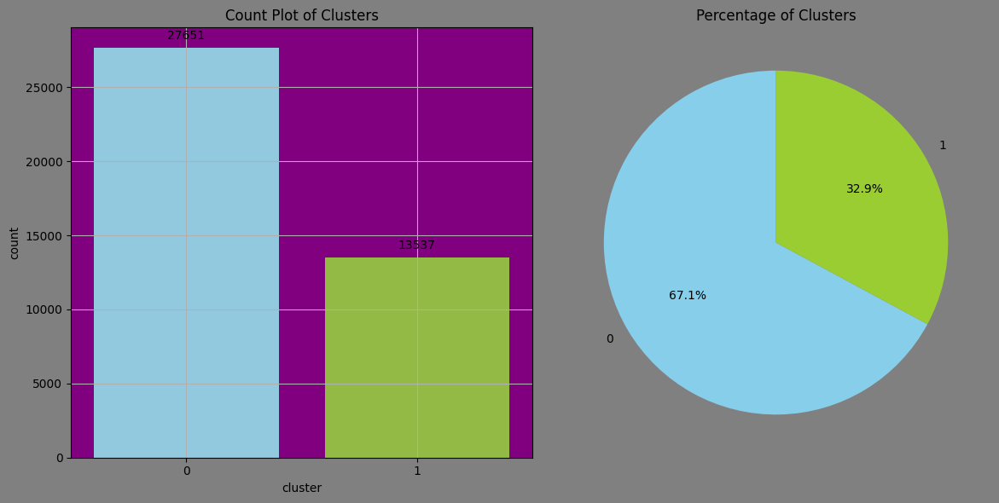

In [58]:
plt.style.use("default")
custom_colors = ["skyblue", "yellowgreen" , 'red' , 'purple' , 'green']
fig, ax = plt.subplots(1, 2, figsize=(12,6),facecolor='gray') 
ax[0].set_facecolor('purple') 

sns.countplot(x='cluster', data=gmmV , ax=ax[0], palette=custom_colors) 
for p in ax[0].patches:
    ax[0].annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), 
                textcoords = 'offset points')
ax[0].grid(True)
ax[0].set_title('Count Plot of Clusters')

cluster_counts = gmmV ['cluster'].value_counts()
ax[1].pie(cluster_counts, labels = cluster_counts.index, autopct='%1.1f%%', startangle=90, 
        colors=custom_colors)
ax[1].set_title('Percentage of Clusters')

plt.tight_layout() 
plt.show()

c:\Users\valhk\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


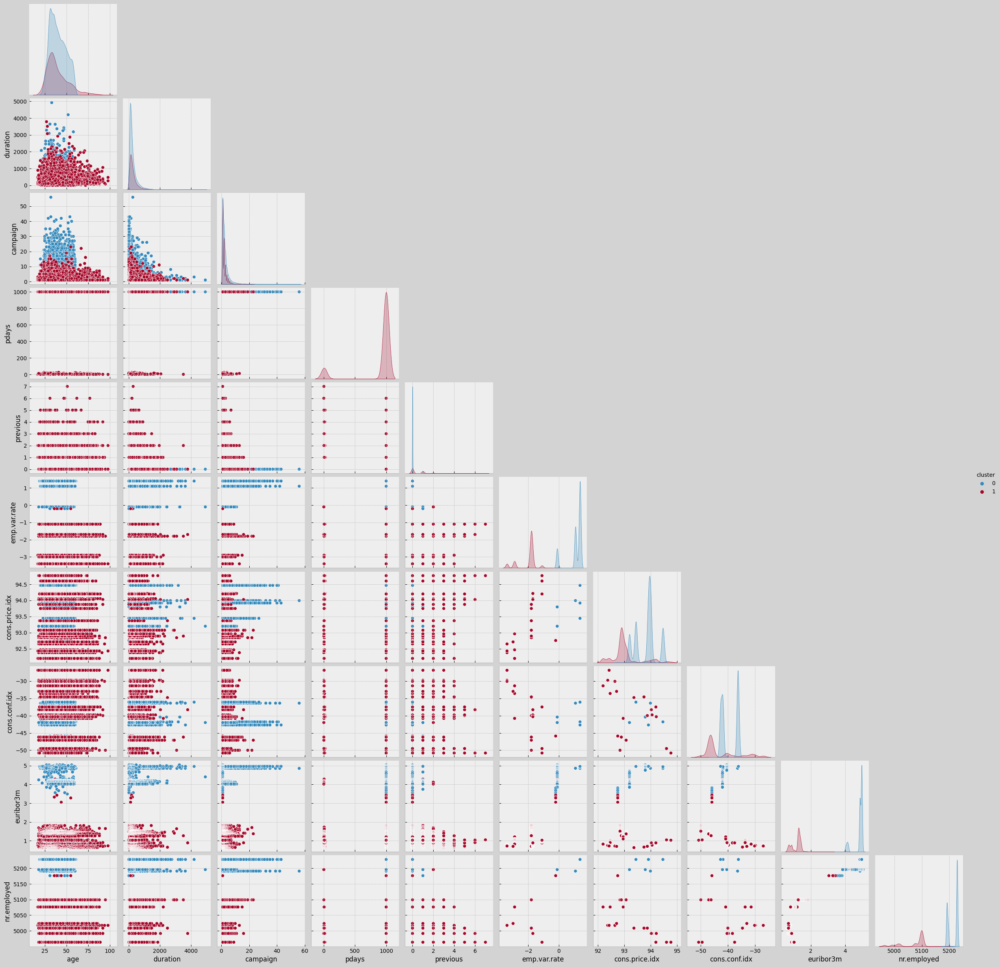

In [59]:
columns_to_plot = ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'cluster']

plt.rcParams['figure.facecolor'] = 'lightgrey'
plt.style.use("bmh")
sns.pairplot(gmmV [columns_to_plot],  hue='cluster', corner=True)

# Testing GMM with all columns

In [60]:
X_cluster_full = X_preprocessed_df.copy()

silhouette = []
calinski_harabasz = []
davies_bouldin = []
for k in range(2,11):
    GMM = GaussianMixture (n_components = k , random_state = 1)
    GMM.fit (X_cluster_full)
    
    score = silhouette_score (X_cluster_full , GMM.predict(X_cluster_full))
    silhouette.append (score)
    
    score1 = calinski_harabasz_score (X_cluster_full, GMM.predict(X_cluster_full))
    calinski_harabasz.append(score1)
    
    score2 = davies_bouldin_score (X_cluster_full, GMM.predict(X_cluster_full))
    davies_bouldin.append (score2)

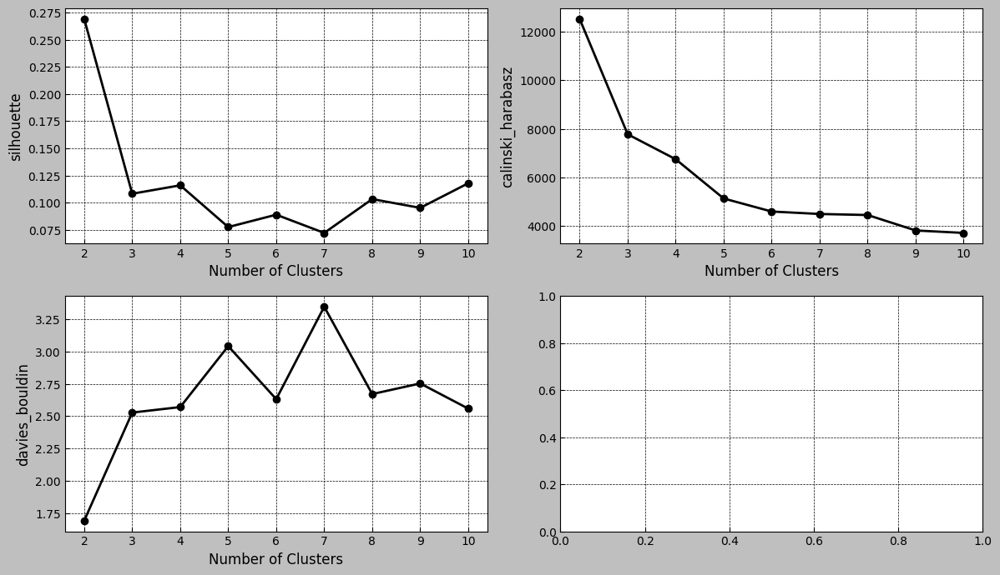

In [61]:

plt.style.use ('grayscale')
fig, axs = plt.subplots(2, 2, figsize=(12, 7))

metrics = {'silhouette': silhouette, 'calinski_harabasz': calinski_harabasz,
           'davies_bouldin': davies_bouldin}
metrics_list = list(metrics.items()) 

for i in range(2): 
    for j in range(2): 
        index = i*2 + j
        if index < len(metrics_list):
            metric_name, metric_values = metrics_list[i*2 + j] 
            axs[i, j].plot(range(2, 11), metric_values , marker = 'o')
            axs[i, j].set_xticks(range(2, 11))
            axs[i, j].set_xlabel('Number of Clusters')
            axs[i, j].set_ylabel(metric_name)
            axs[i, j].grid(True)

plt.tight_layout()
plt.show()

Lets try the final model from before to see if we gained performance

In [69]:
# all scores for best parameters
GMM = GaussianMixture (n_components = 2 , random_state = 1 , covariance_type = 'diag')
GMM.fit (X_cluster_full)
    
print ('silhouette_score : ' , silhouette_score (X_cluster_full , GMM.predict(X_cluster_full)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster_full, GMM.predict(X_cluster_full)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster_full, GMM.predict(X_cluster_full)))

silhouette_score :  0.26593836645156066
calinski_harabasz_score :  12364.544302258617
davies_bouldin_score :  1.7081085440006645


In [73]:
silhouette = []
covariance_type_values = ['tied', 'diag', 'spherical', 'full']
for i in covariance_type_values:
    GMM = GaussianMixture(n_components = 2, random_state = 1, covariance_type = i)
    GMM.fit(X_cluster_full)
    score = silhouette_score(X_cluster_full, GMM.predict(X_cluster_full))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_covariance_type = pd.DataFrame(covariance_type_values, columns=['covariance_types'])
result = pd.concat([df_covariance_type, df_silhouette], axis=1)
result

,covariance_types,silhouette_score
0,tied,0.268874
1,diag,0.265938
2,spherical,0.257981
3,full,0.268975


This time full is best

The scores look worse, lets plot the PCA

In [74]:
gmmV = df_cluster.copy ()
GMM = GaussianMixture (n_components = 2 , random_state = 1, covariance_type= 'full' )
GMM.fit (X_cluster_full)
gmmV ['cluster'] = GMM.predict(X_cluster_full)

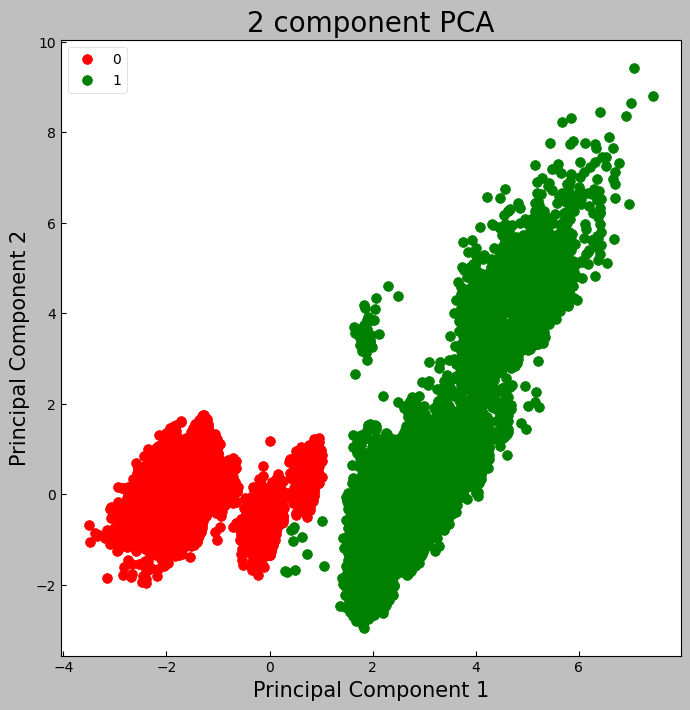

In [75]:
# Visualizing the clusters using PCA

from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster_full)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

finalDf = pd.concat([principalDf, gmmV[['cluster']]], axis = 1)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0, 1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

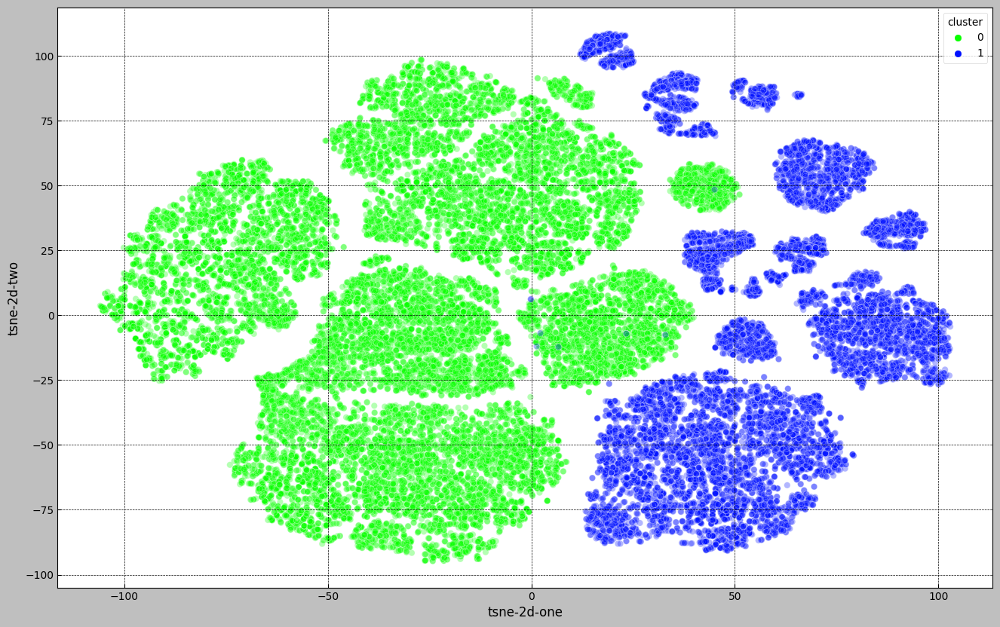

In [76]:
# Visualizing the clusters using t-SNE

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=1)
tsne_results = tsne.fit_transform(X_cluster_full)

gmmV['tsne-2d-one'] = tsne_results[:,0]
gmmV['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="cluster",
    palette=sns.color_palette("hsv", 2),
    data=gmmV,
    legend="full",
    alpha=0.3
)

The visualisations also look worse

# Lets try a better approach for categorical column to improve the model

In [233]:
X_test = df_cluster.drop(columns=['month', 'day_of_week', 'contact'])
X_test

,age,job,marital,education,default,housing,loan,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscribed
0,56,housemaid,married,basic.4y,no,no,no,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [234]:
X_test['duration'] = np.log1p(X_test['duration'])

scaler = StandardScaler()
X_test[numerical_cols_c] = scaler.fit_transform(X_test[numerical_cols_c])


In [235]:
X_test['marital'].value_counts()

marital
married     24928
single      11568
divorced     4612
unknown        80
Name: count, dtype: int64

In [236]:
# Set unknown values to single category
X_test['marital'] = X_test['marital'].replace('unknown', 'single')

In [237]:
encoded_columns = pd.get_dummies(X_test['marital'], drop_first=True)
X_test = X_test.drop('marital', axis=1) 
X_test = pd.concat([X_test, encoded_columns], axis=1)

In [238]:
X_test['education'].value_counts()

education
university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: count, dtype: int64

In [239]:
# Set basic.4y, basic.6y, basic.9y to high.school, as they are all basic education
X_test['education'] = X_test['education'].replace(['basic.4y', 'basic.6y', 'basic.9y'], 'high.school')

# Set illiterate to unknown
X_test['education'] = X_test['education'].replace('illiterate', 'unknown')

In [240]:
encoded_columns = pd.get_dummies(X_test['education'], drop_first=True)
X_test = X_test.drop('education', axis=1) 
X_test = pd.concat([X_test, encoded_columns], axis=1)

In [241]:
X_test['job'].value_counts()

job
admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64

In [242]:
def group_jobs(job):
    if job in ['admin.', 'management']:
        return 'White-Collar'
    elif job in ['blue-collar', 'services', 'housemaid']:
        return 'Blue-Collar'
    elif job in ['self-employed', 'entrepreneur']:
        return 'Self-Employed'
    elif job in ['student', 'unemployed', 'retired']:
        return 'No-Active-Income'
    elif job == 'unknown':
        return 'Unknown'
    else:
        return 'Skilled Professionals'

X_test['job'] = X_test['job'].apply(group_jobs)


In [243]:
encoded_columns = pd.get_dummies(X_test['job'], drop_first=True)
X_test = X_test.drop('job', axis=1) 
X_test = pd.concat([X_test, encoded_columns], axis=1)

In [244]:
X_test['default'].value_counts()

default
no         32588
unknown     8597
yes            3
Name: count, dtype: int64

In [245]:
X_test.drop(columns=['default'], inplace=True)

Not a very informative column

In [246]:
X_test['housing'].value_counts()

housing
yes        21576
no         18622
unknown      990
Name: count, dtype: int64

In [247]:
X_test['loan'].value_counts()

loan
no         33950
yes         6248
unknown      990
Name: count, dtype: int64

Might be good to drop those if we use this data or impute using knn

In [248]:
X_test['poutcome'].value_counts()

# Maybe 1 for success, -1 for failure, 0 for nonexistent

poutcome
nonexistent    35563
failure         4252
success         1373
Name: count, dtype: int64

In [249]:
X_test['poutcome'] = X_test['poutcome'].replace('nonexistent', 0)
X_test['poutcome'] = X_test['poutcome'].replace('failure', -1)
X_test['poutcome'] = X_test['poutcome'].replace('success', 1)

In [250]:
X_test['subscribed'].value_counts()

subscribed
no     36548
yes     4640
Name: count, dtype: int64

In [251]:
# Encode subscribed column
X_test['subscribed'] = X_test['subscribed'].replace('yes', 1)
X_test['subscribed'] = X_test['subscribed'].replace('no', 0)

In [252]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder

# Example encoding: 'yes' -> 1, 'no' -> 0, 'unknown' -> np.nan
def encode_columns(df, columns):
    encoded_df = df.copy()
    for col in columns:
        encoded_df[col] = encoded_df[col].map({'yes': 1, 'no': 0, 'unknown': np.nan})
    return encoded_df

# Assuming 'housing' and 'loan' are the columns to impute in X_test
X_test_1 = encode_columns(X_test, ['housing', 'loan'])

# Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5, weights='uniform')

# Impute missing values
X_test_imputed = knn_imputer.fit_transform(X_test_1)

# The imputed data is returned as a NumPy array, so let's convert it back to a DataFrame
X_test_imputed_df = pd.DataFrame(X_test_imputed, columns=X_test_1.columns, index=X_test_1.index)

In [253]:
X_test_imputed_df.head()

,age,housing,loan,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscribed,married,single,professional.course,university.degree,unknown,No-Active-Income,Self-Employed,Skilled Professionals,Unknown,White-Collar
0,1.533034,0.0,0.0,0.431124,-0.565922,0.195414,-0.349494,0.0,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.628993,0.0,0.0,-0.177114,-0.565922,0.195414,-0.349494,0.0,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.290186,1.0,0.0,0.274738,-0.565922,0.195414,-0.349494,0.0,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.002309,0.0,0.0,-0.162669,-0.565922,0.195414,-0.349494,0.0,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.533034,0.0,1.0,0.607534,-0.565922,0.195414,-0.349494,0.0,0.648092,0.722722,0.886447,0.71246,0.33168,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [254]:
X_cluster_full = X_test_imputed_df.copy()

silhouette = []
calinski_harabasz = []
davies_bouldin = []
for k in range(2,11):
    GMM = GaussianMixture (n_components = k , random_state = 1)
    GMM.fit (X_cluster_full)
    
    score = silhouette_score (X_cluster_full , GMM.predict(X_cluster_full))
    silhouette.append (score)
    
    score1 = calinski_harabasz_score (X_cluster_full, GMM.predict(X_cluster_full))
    calinski_harabasz.append(score1)
    
    score2 = davies_bouldin_score (X_cluster_full, GMM.predict(X_cluster_full))
    davies_bouldin.append (score2)

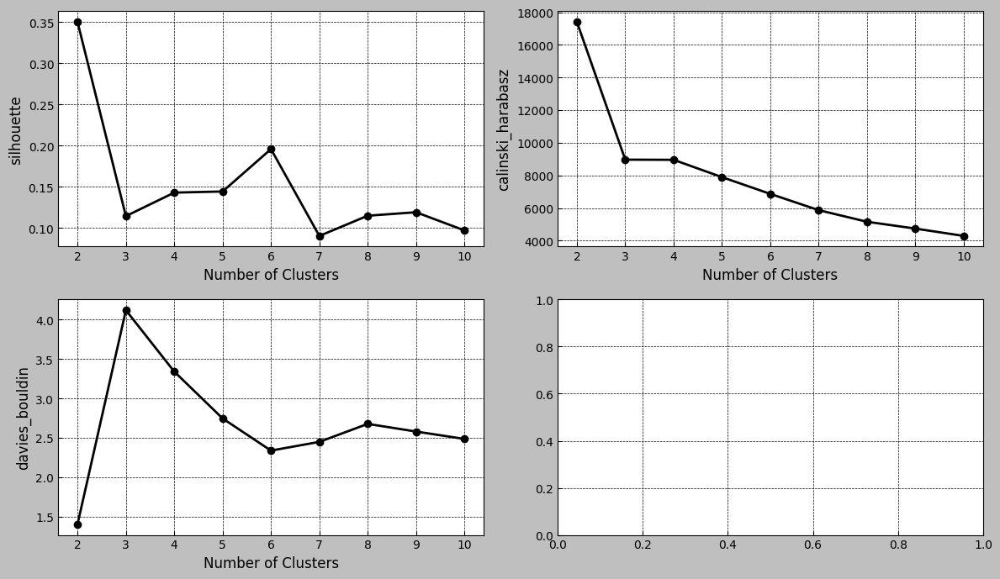

In [255]:
plt.style.use ('grayscale')
fig, axs = plt.subplots(2, 2, figsize=(12, 7))

metrics = {'silhouette': silhouette, 'calinski_harabasz': calinski_harabasz,
           'davies_bouldin': davies_bouldin}
metrics_list = list(metrics.items()) 

for i in range(2): 
    for j in range(2): 
        index = i*2 + j
        if index < len(metrics_list):
            metric_name, metric_values = metrics_list[i*2 + j] 
            axs[i, j].plot(range(2, 11), metric_values , marker = 'o')
            axs[i, j].set_xticks(range(2, 11))
            axs[i, j].set_xlabel('Number of Clusters')
            axs[i, j].set_ylabel(metric_name)
            axs[i, j].grid(True)

plt.tight_layout()
plt.show()

In [256]:
silhouette = []
covariance_type_values = ['tied', 'diag', 'spherical', 'full']
for i in covariance_type_values:
    GMM = GaussianMixture(n_components = 2, random_state = 1, covariance_type = i)
    GMM.fit(X_cluster_full)
    score = silhouette_score(X_cluster_full, GMM.predict(X_cluster_full))
    silhouette.append(score)


df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_covariance_type = pd.DataFrame(covariance_type_values, columns=['covariance_types'])
result = pd.concat([df_covariance_type, df_silhouette], axis=1)
result

,covariance_types,silhouette_score
0,tied,0.350145
1,diag,0.350325
2,spherical,0.326172
3,full,0.350292


In [257]:
# all scores for best parameters
GMM = GaussianMixture (n_components = 2 , random_state = 1 , covariance_type = 'diag')
GMM.fit (X_cluster_full)
    
print ('silhouette_score : ' , silhouette_score (X_cluster_full , GMM.predict(X_cluster_full)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster_full, GMM.predict(X_cluster_full)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster_full, GMM.predict(X_cluster_full)))

silhouette_score :  0.35032546896361494
calinski_harabasz_score :  17413.229948469558
davies_bouldin_score :  1.4056403245391216


The silhouette score does not increase using the added categorical variables

# DBSCAN

## using only numerical data

In [259]:
from sklearn.cluster import DBSCAN

silhouette = []
calinski_harabasz = []
davies_bouldin = []
eps_values = []
min_samples_values = []
for eps in range (10 , 20):
    eps = eps / 10
    for min_samples in range (9 , 15):
        DB = DBSCAN (eps = eps , min_samples = min_samples , n_jobs = -1)
        DB.fit (X_cluster)
        
        eps_values.append(eps)
        min_samples_values.append(min_samples)
        score = silhouette_score (X_cluster , DB.fit_predict(X_cluster))
        silhouette.append (score)
        score1 = calinski_harabasz_score (X_cluster, DB.fit_predict(X_cluster))
        calinski_harabasz.append(score1)
        score2 = davies_bouldin_score (X_cluster, DB.fit_predict(X_cluster))
        davies_bouldin.append (score2)
        
df_eps = pd.DataFrame(eps_values, columns=['eps'])
df_min_samples = pd.DataFrame(min_samples_values, columns=['min_samples'])    
df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_calinski_harabasz = pd.DataFrame(calinski_harabasz, columns=['calinski_harabasz'])
df_davies_bouldin = pd.DataFrame(davies_bouldin , columns=['davies_bouldin'])

result = pd.concat([df_eps, df_min_samples,df_silhouette , df_calinski_harabasz , df_davies_bouldin], axis=1)
result

,eps,min_samples,silhouette_score,calinski_harabasz,davies_bouldin
0,1.0,9,0.124031,2371.293436,1.683512
1,1.0,10,0.123676,2491.443338,1.705873
2,1.0,11,0.123314,2396.158449,1.677121
3,1.0,12,0.123329,2362.580685,1.670516
4,1.0,13,0.118788,2228.223910,1.626441
5,1.0,14,0.102831,2164.264478,1.620320
6,1.1,9,0.134672,2379.952746,1.688648
7,1.1,10,0.128675,2390.041237,1.678037
8,1.1,11,0.128705,2422.529605,1.702857
9,1.1,12,0.128409,2463.998242,1.708198


In [260]:
top_5_silhouette_score = result.nlargest(5, 'silhouette_score')
top_5_calinski_harabasz = result.nlargest(5, 'calinski_harabasz')
top_5_davies_bouldin = result.nsmallest(5, 'davies_bouldin')

print ('Top 5 silhouette scores : \n' , top_5_silhouette_score)
print ('Top 5 calinski harabasz scores : \n' , top_5_calinski_harabasz)
print ('Top 5 davies bouldin scores : \n' , top_5_davies_bouldin)

Top 5 silhouette scores : 
     eps  min_samples  silhouette_score  calinski_harabasz  davies_bouldin
43  1.7           10          0.251934        2646.339156        1.765459
42  1.7            9          0.251928        2544.598563        1.754867
44  1.7           11          0.251655        2636.424187        1.773977
36  1.6            9          0.251445        2434.296186        1.746184
45  1.7           12          0.251334        2746.825233        1.786969
Top 5 calinski harabasz scores : 
     eps  min_samples  silhouette_score  calinski_harabasz  davies_bouldin
45  1.7           12          0.251334        2746.825233        1.786969
46  1.7           13          0.251095        2741.534155        1.786998
47  1.7           14          0.250944        2738.383769        1.790811
40  1.6           13          0.250532        2724.547366        1.766428
41  1.6           14          0.250344        2721.370826        1.754956
Top 5 davies bouldin scores : 
     eps  min_samp

In [263]:
DBV = X_cluster_full.copy ()
DB = DBSCAN (eps = 1.7 , min_samples = 12 , n_jobs = -1)
DB.fit (X_cluster_full)
DBV ['cluster'] = DB.fit_predict (X_cluster_full)

In [264]:
# Print scores
print ('silhouette_score : ' , silhouette_score (X_cluster_full , DB.fit_predict(X_cluster_full)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster_full, DB.fit_predict(X_cluster_full)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster_full, DB.fit_predict(X_cluster_full)))

silhouette_score :  0.16940865838727207
calinski_harabasz_score :  1639.1550657900486
davies_bouldin_score :  1.7419090791915428


In [267]:
# print cluster counts
print (DBV ['cluster'].value_counts())

cluster
 0     26653
 2      6456
 3      2251
-1      2047
 6      1825
 1       683
 7       275
 8       205
 5       189
 11      127
 10      115
 4       110
 20       65
 12       62
 16       24
 19       18
 13       17
 18       14
 17       14
 9        13
 15       13
 14       12
Name: count, dtype: int64


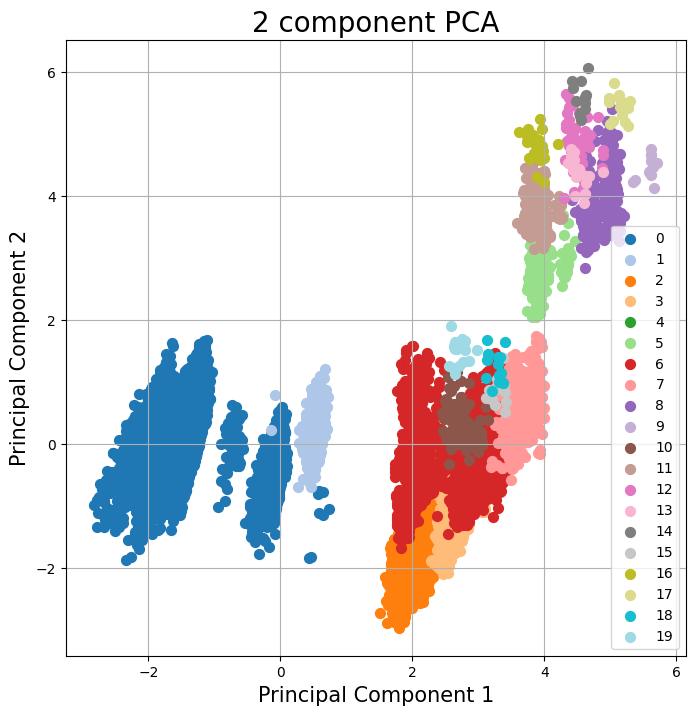

In [270]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

# Assuming X_cluster_full is your dataset after preprocessing and DBV['cluster'] contains the cluster assignments

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster_full)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# Assuming DBV['cluster'] contains the cluster labels for each point
finalDf = pd.concat([principalDf, DBV[['cluster']]], axis=1)

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlabel('Principal Component 1', fontsize=15)
ax.set_ylabel('Principal Component 2', fontsize=15)
ax.set_title('2 component PCA', fontsize=20)

# Update for 14 clusters
targets = list(range(21))  # Assuming cluster labels are 0 through 13
# Use a colormap to generate 14 distinct colors
colors = plt.cm.tab20(np.linspace(0, 1, 21))

for target, color in zip(targets, colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1'],
               finalDf.loc[indicesToKeep, 'principal component 2'],
               c=[color],
               s=50)

ax.legend(targets)
ax.grid()


C:\Users\valhk\AppData\Local\Temp\ipykernel_10136\679217664.py:12: UserWarning: 
The palette list has fewer values (20) than needed (22) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(


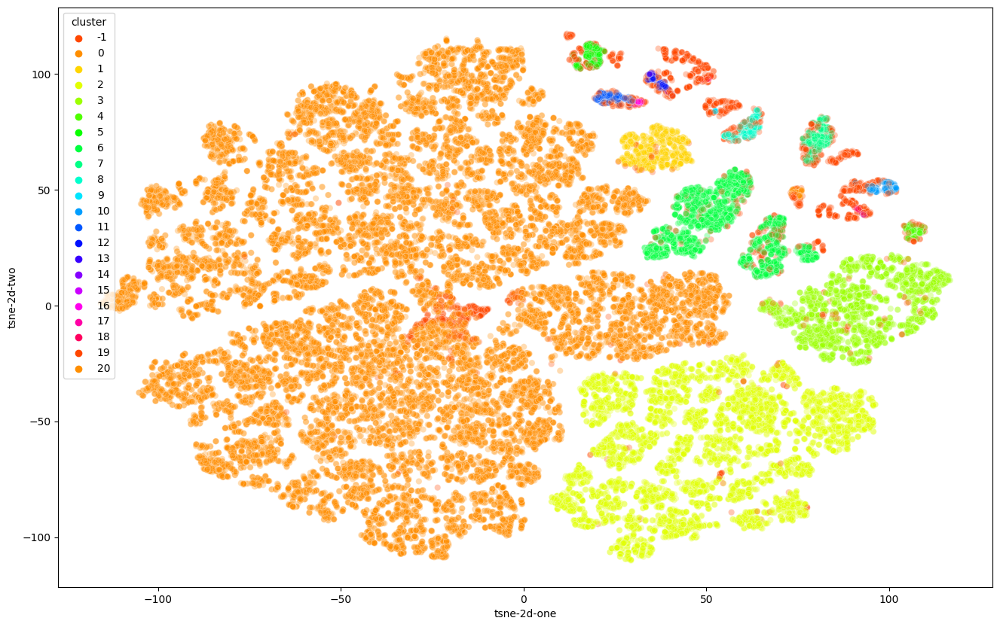

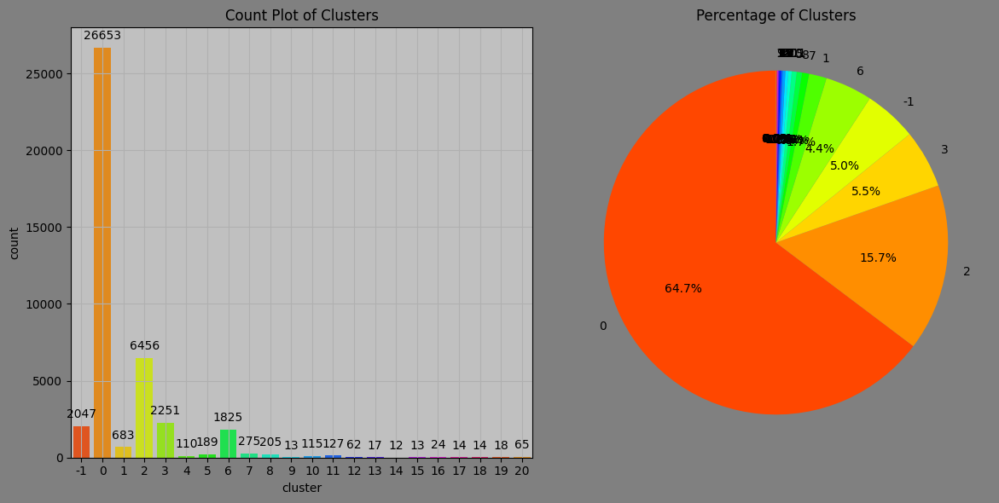

In [271]:
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=1)
tsne_results = tsne.fit_transform(X_cluster_full)

DBV['tsne-2d-one'] = tsne_results[:, 0]
DBV['tsne-2d-two'] = tsne_results[:, 1]

plt.figure(figsize=(16, 10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="cluster",
    palette=sns.color_palette("hsv", 21),  
    data=DBV,
    legend="full",
    alpha=0.3
)

custom_colors = sns.color_palette("hsv", 21)  
fig, ax = plt.subplots(1, 2, figsize=(12, 6), facecolor='gray')
ax[0].set_facecolor('silver')

sns.countplot(x='cluster', data=DBV, ax=ax[0], palette=custom_colors)
for p in ax[0].patches:
    ax[0].annotate(format(p.get_height(), '.0f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 10),
                   textcoords='offset points')
ax[0].grid(True)
ax[0].set_title('Count Plot of Clusters')

cluster_counts = DBV['cluster'].value_counts()
ax[1].pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=90,
          colors=custom_colors)
ax[1].set_title('Percentage of Clusters')

plt.tight_layout()
plt.show()


DB scan performs pretty poorly. Let's not try with categorical variables

## Using only numerical variables

In [272]:
X_cluster

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,1.533034,0.431124,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680
1,1.628993,-0.177114,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680
2,-0.290186,0.274738,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680
3,-0.002309,-0.162669,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680
4,1.533034,0.607534,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680
...,...,...,...,...,...,...,...,...,...,...
41183,3.164336,0.699178,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.224953,-1.495186,-2.815697
41184,0.573445,0.848058,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.224953,-1.495186,-2.815697
41185,1.533034,0.080692,-0.204909,0.195414,-0.349494,-0.752343,2.058168,-2.224953,-1.495186,-2.815697
41186,0.381527,1.003934,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.224953,-1.495186,-2.815697


In [273]:
silhouette = []
calinski_harabasz = []
davies_bouldin = []
eps_values = []
min_samples_values = []
for eps in range (10 , 20):
    eps = eps / 10
    for min_samples in range (9 , 15):
        DB = DBSCAN (eps = eps , min_samples = min_samples , n_jobs = -1)
        DB.fit (X_cluster)
        
        eps_values.append(eps)
        min_samples_values.append(min_samples)
        score = silhouette_score (X_cluster , DB.fit_predict(X_cluster))
        silhouette.append (score)
        score1 = calinski_harabasz_score (X_cluster, DB.fit_predict(X_cluster))
        calinski_harabasz.append(score1)
        score2 = davies_bouldin_score (X_cluster, DB.fit_predict(X_cluster))
        davies_bouldin.append (score2)
        
df_eps = pd.DataFrame(eps_values, columns=['eps'])
df_min_samples = pd.DataFrame(min_samples_values, columns=['min_samples'])    
df_silhouette = pd.DataFrame(silhouette, columns=['silhouette_score'])
df_calinski_harabasz = pd.DataFrame(calinski_harabasz, columns=['calinski_harabasz'])
df_davies_bouldin = pd.DataFrame(davies_bouldin , columns=['davies_bouldin'])

result = pd.concat([df_eps, df_min_samples,df_silhouette , df_calinski_harabasz , df_davies_bouldin], axis=1)
result

,eps,min_samples,silhouette_score,calinski_harabasz,davies_bouldin
0,1.0,9,0.124031,2371.293436,1.683512
1,1.0,10,0.123676,2491.443338,1.705873
2,1.0,11,0.123314,2396.158449,1.677121
3,1.0,12,0.123329,2362.580685,1.670516
4,1.0,13,0.118788,2228.223910,1.626441
5,1.0,14,0.102831,2164.264478,1.620320
6,1.1,9,0.134672,2379.952746,1.688648
7,1.1,10,0.128675,2390.041237,1.678037
8,1.1,11,0.128705,2422.529605,1.702857
9,1.1,12,0.128409,2463.998242,1.708198


In [274]:
top_5_silhouette_score = result.nlargest(5, 'silhouette_score')
top_5_calinski_harabasz = result.nlargest(5, 'calinski_harabasz')
top_5_davies_bouldin = result.nsmallest(5, 'davies_bouldin')

print ('Top 5 silhouette scores : \n' , top_5_silhouette_score)
print ('Top 5 calinski harabasz scores : \n' , top_5_calinski_harabasz)
print ('Top 5 davies bouldin scores : \n' , top_5_davies_bouldin)

Top 5 silhouette scores : 
     eps  min_samples  silhouette_score  calinski_harabasz  davies_bouldin
43  1.7           10          0.251934        2646.339156        1.765459
42  1.7            9          0.251928        2544.598563        1.754867
44  1.7           11          0.251655        2636.424187        1.773977
36  1.6            9          0.251445        2434.296186        1.746184
45  1.7           12          0.251334        2746.825233        1.786969
Top 5 calinski harabasz scores : 
     eps  min_samples  silhouette_score  calinski_harabasz  davies_bouldin
45  1.7           12          0.251334        2746.825233        1.786969
46  1.7           13          0.251095        2741.534155        1.786998
47  1.7           14          0.250944        2738.383769        1.790811
40  1.6           13          0.250532        2724.547366        1.766428
41  1.6           14          0.250344        2721.370826        1.754956
Top 5 davies bouldin scores : 
     eps  min_samp

In [275]:
DBV = X_cluster_full.copy ()
DB = DBSCAN (eps = 1.7 , min_samples = 12 , n_jobs = -1)
DB.fit (X_cluster_full)
DBV ['cluster'] = DB.fit_predict (X_cluster_full)

In [276]:
# Print scores
print ('silhouette_score : ' , silhouette_score (X_cluster_full , DB.fit_predict(X_cluster_full)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster_full, DB.fit_predict(X_cluster_full)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster_full, DB.fit_predict(X_cluster_full)))

silhouette_score :  0.16940865838727207
calinski_harabasz_score :  1639.1550657900486
davies_bouldin_score :  1.7419090791915428


Not worth exploring more

# MeanShift

In [284]:
from sklearn.cluster import MeanShift

MS = MeanShift ()
MS.fit (X_cluster)
labels = MS.labels_
len (set (labels))

4

In [285]:
# print bandwidth

print (MS.get_params())

# print scores

print ('silhouette_score : ' , silhouette_score (X_cluster , labels))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster, labels))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster, labels))

{'bandwidth': None, 'bin_seeding': False, 'cluster_all': True, 'max_iter': 300, 'min_bin_freq': 1, 'n_jobs': None, 'seeds': None}


silhouette_score :  0.4990153085282989
calinski_harabasz_score :  3236.640214988028
davies_bouldin_score :  0.9917816133092899


In [286]:
# print cluster counts
print (pd.Series(labels).value_counts())

0    39258
1     1782
2      108
3       40
Name: count, dtype: int64


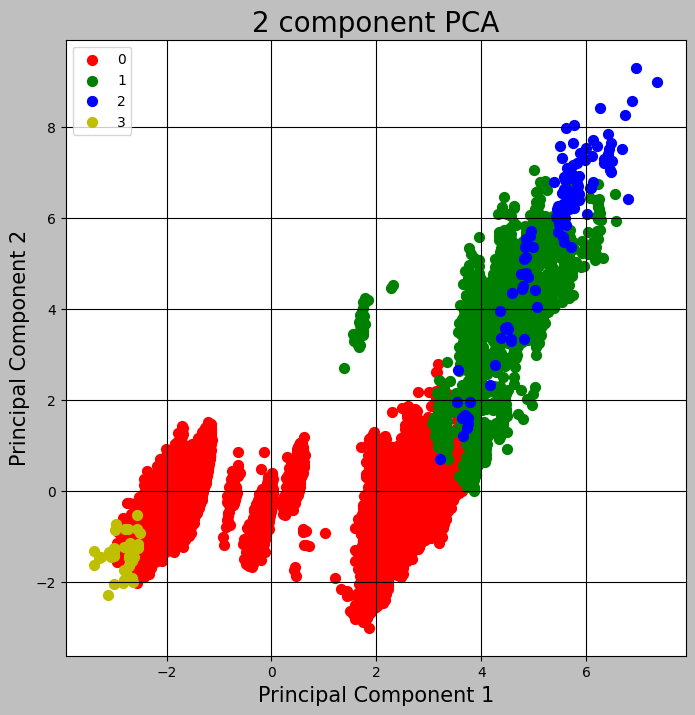

In [287]:
# Visualizing the clusters using PCA for the 4 clusters

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_cluster)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

finalDf = pd.concat([principalDf, pd.DataFrame({'cluster': labels})], axis = 1)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = list(set(labels))
colors = ['r', 'g', 'b', 'y']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

C:\Users\valhk\AppData\Local\Temp\ipykernel_10136\1037326354.py:14: UserWarning: 
The palette list has fewer values (4) than needed (22) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(


Text(0.5, 1.0, 'Count Plot of Clusters')

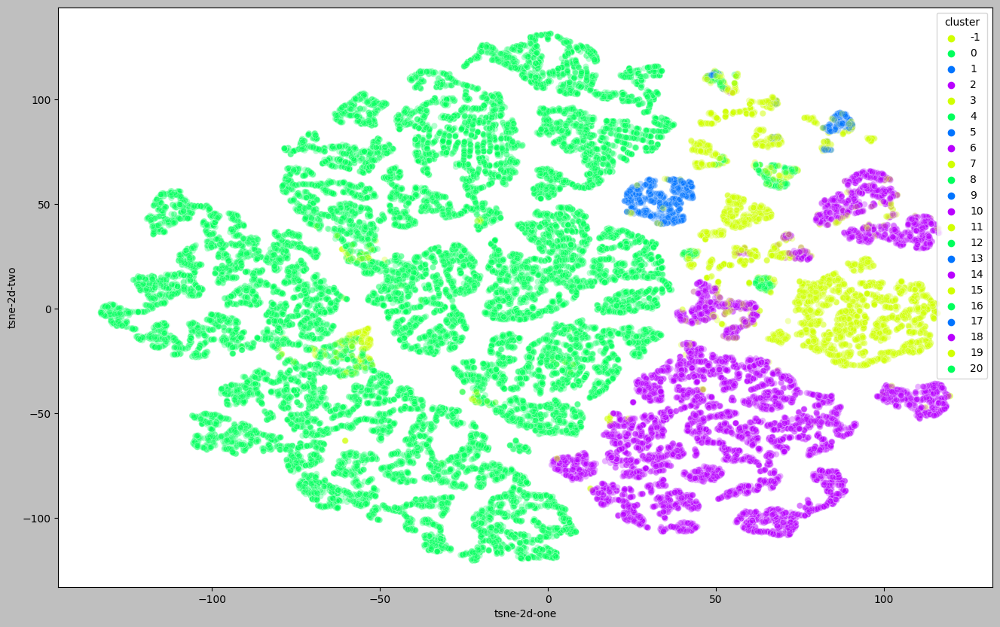

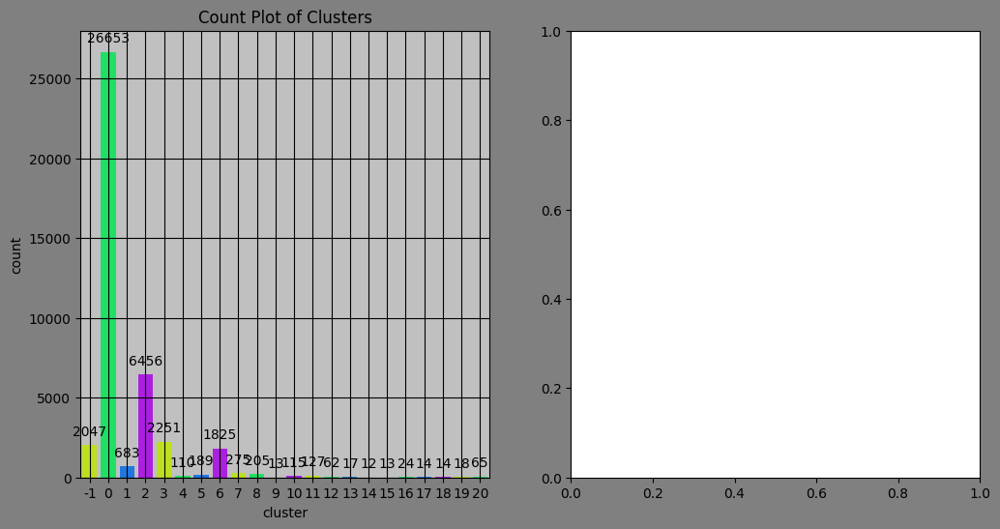

In [288]:
# Visualizing the clusters using t-SNE for the 4 clusters

from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=1)
tsne_results = tsne.fit_transform(X_cluster)

DBV['tsne-2d-one'] = tsne_results[:,0]
DBV['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="cluster",
    palette=sns.color_palette("hsv", len(set(labels))),
    data=DBV,
    legend="full",
    alpha=0.3
)

custom_colors = sns.color_palette("hsv", len(set(labels)))

fig, ax = plt.subplots(1, 2, figsize=(12,6),facecolor='gray')
ax[0].set_facecolor('silver')

sns.countplot(x='cluster', data=DBV, ax=ax[0], palette=custom_colors)
for p in ax[0].patches:
    ax[0].annotate(format(p.get_height(), '.0f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 10),
                   textcoords='offset points')
ax[0].grid(True)
ax[0].set_title('Count Plot of Clusters')

# Fine tuning best model

# Analyising cluster content

## GMM

In [290]:
# Analyzing the clusters for best GMM model
GMM_best

GaussianMixture(covariance_type='diag', n_components=2, random_state=1)

In [292]:
print ('silhouette_score : ' , silhouette_score (X_cluster , GMM_best.predict(X_cluster)))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster, GMM_best.predict(X_cluster)))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster, GMM_best.predict(X_cluster)))

silhouette_score :  0.4211047210390259
calinski_harabasz_score :  22379.38029530513
davies_bouldin_score :  1.2012019256177902


In [293]:
# Analyzing the clusters

gmmV = df_cluster.copy ()
gmmV ['cluster'] = GMM_best.predict(X_cluster)

cluster_stats = gmmV.groupby('cluster').describe()
print(cluster_stats)

             age                                                     duration  \
           count       mean        std   min   25%   50%   75%   max    count   
cluster                                                                         
0        27655.0  40.193527   9.188239  18.0  33.0  39.0  47.0  61.0  27655.0   
1        13533.0  39.677751  12.563577  17.0  31.0  36.0  46.0  98.0  13533.0   

                                                                  campaign  \
               mean         std  min    25%    50%    75%     max    count   
cluster                                                                      
0        252.345001  261.980159  0.0   98.0  171.0  306.0  4918.0  27655.0   
1        270.423557  253.247111  0.0  113.0  200.0  340.0  3785.0  13533.0   

                                                         pdays              \
             mean       std  min  25%  50%  75%   max    count        mean   
cluster                                        

In [296]:
# Scaled data

gmmV = X_cluster.copy ()
gmmV ['cluster'] = GMM_best.predict(X_cluster)

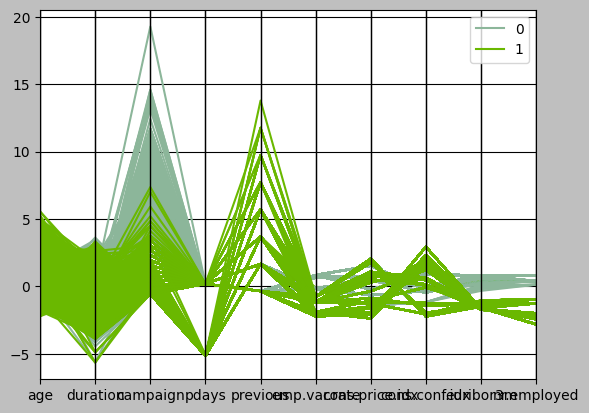

In [297]:
from pandas.plotting import parallel_coordinates
# Normalize your dataset if necessary to make the plot more interpretable
parallel_coordinates(gmmV.assign(cluster=gmmV['cluster'].astype(str)), 'cluster')
plt.show()

c:\Users\valhk\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


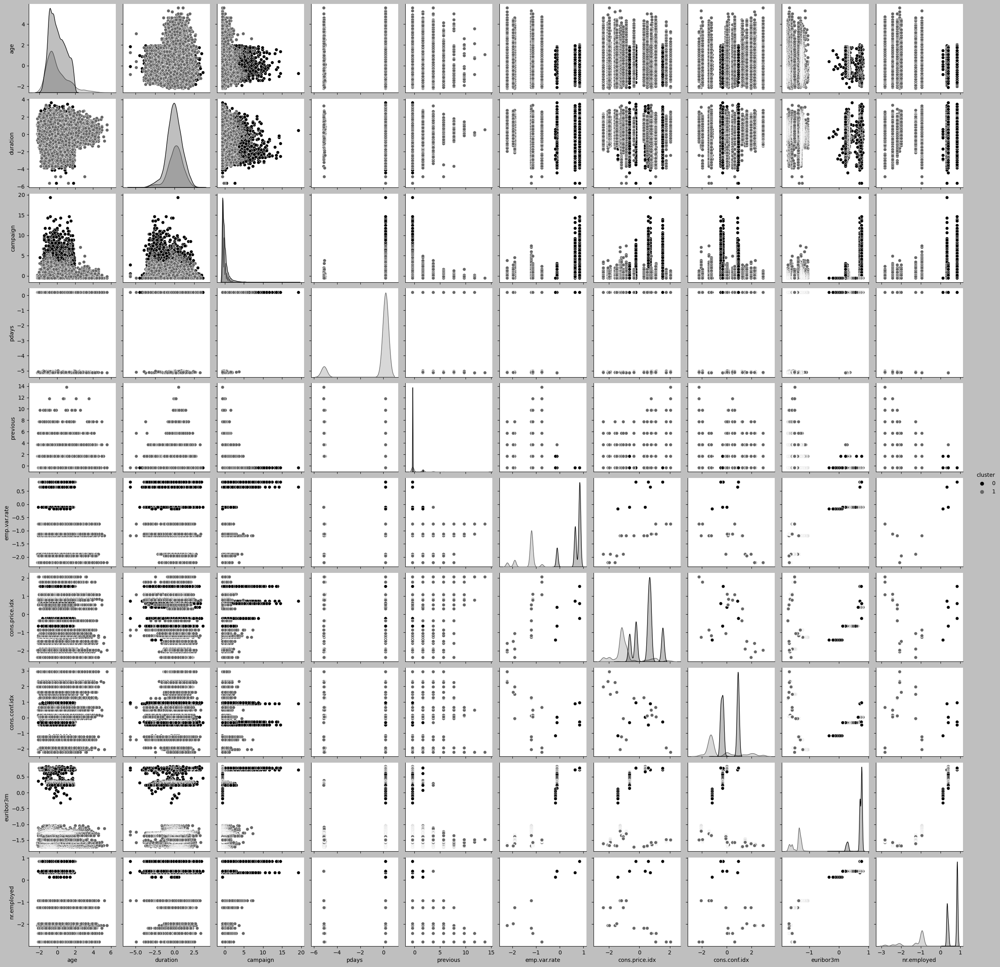

In [298]:
import seaborn as sns
sns.pairplot(gmmV, hue='cluster')

In [310]:
gmmV = X_cluster.copy ()
gmmV ['cluster'] = GMM_best.predict(X_cluster)

In [311]:
gmmV

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,cluster
0,1.533034,0.431124,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680,0
1,1.628993,-0.177114,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680,0
2,-0.290186,0.274738,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680,0
3,-0.002309,-0.162669,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680,0
4,1.533034,0.607534,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.886447,0.712460,0.331680,0
...,...,...,...,...,...,...,...,...,...,...,...
41183,3.164336,0.699178,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.224953,-1.495186,-2.815697,1
41184,0.573445,0.848058,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.224953,-1.495186,-2.815697,1
41185,1.533034,0.080692,-0.204909,0.195414,-0.349494,-0.752343,2.058168,-2.224953,-1.495186,-2.815697,1
41186,0.381527,1.003934,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.224953,-1.495186,-2.815697,1


In [312]:
used_columns = gmmV.columns[:-1]
centroids = pd.DataFrame(GMM_best.means_, columns=used_columns[:10])  # Assuming the last column is 'cluster'
print(centroids)

        age  duration  campaign     pdays  previous  emp.var.rate  \
0  0.016262 -0.030973  0.084007  0.195414 -0.298421      0.659132   
1 -0.033231  0.063294 -0.171670 -0.399333  0.609831     -1.346951   

   cons.price.idx  cons.conf.idx  euribor3m  nr.employed  
0        0.462660       0.225470   0.689984     0.641798  
1       -0.945457      -0.460754  -1.409998    -1.311529  


In [323]:
# Print unscaled centroids

centroids_unscaled = pd.DataFrame(scaler.inverse_transform(GMM_best.means_), columns=used_columns[:10])
print(centroids_unscaled)

         age  duration  campaign       pdays  previous  emp.var.rate  \
0  40.193527  5.144636  2.800289  999.000000  0.025276      1.117342   
1  39.677751  5.231072  2.092071  887.836701  0.474765     -2.034094   

   cons.price.idx  cons.conf.idx  euribor3m  nr.employed  
0       93.843467     -39.459092   4.818017  5213.406249  
1       93.028403     -42.635033   1.175752  5072.277054  


## Mean Shift

In [317]:
MS

MeanShift()

In [313]:
MS.get_params()

{'bandwidth': None,
 'bin_seeding': False,
 'cluster_all': True,
 'max_iter': 300,
 'min_bin_freq': 1,
 'n_jobs': None,
 'seeds': None}

In [315]:
labels = MS.labels_

print ('silhouette_score : ' , silhouette_score (X_cluster , labels))
print ('calinski_harabasz_score : ' , calinski_harabasz_score (X_cluster, labels))
print ('davies_bouldin_score : ' , davies_bouldin_score (X_cluster, labels))

silhouette_score :  0.4990153085282989
calinski_harabasz_score :  3236.640214988028
davies_bouldin_score :  0.9917816133092899


In [316]:
# Analyzing the clusters

MSv = df_cluster.copy ()
MSv ['cluster'] = MS.labels_

cluster_stats = MSv.groupby('cluster').describe()
print(cluster_stats)

             age                                                       \
           count       mean        std   min    25%   50%   75%   max   
cluster                                                                 
0        39258.0  39.943196  10.123925  17.0  32.00  38.0  47.0  98.0   
1         1782.0  41.687430  15.195283  17.0  30.00  37.0  52.0  98.0   
2          108.0  41.768519  16.569653  19.0  29.75  37.0  51.0  92.0   
3           40.0  40.575000   9.164837  25.0  34.00  38.5  47.5  58.0   

        duration                                                              \
           count        mean         std  min     25%    50%     75%     max   
cluster                                                                        
0        39258.0  255.754012  259.030725  0.0  101.00  177.0  316.00  4918.0   
1         1782.0  319.753086  263.550659  8.0  156.25  251.0  389.75  3509.0   
2          108.0  240.500000  144.908124  1.0  137.75  210.0  309.00   691.0   
3       

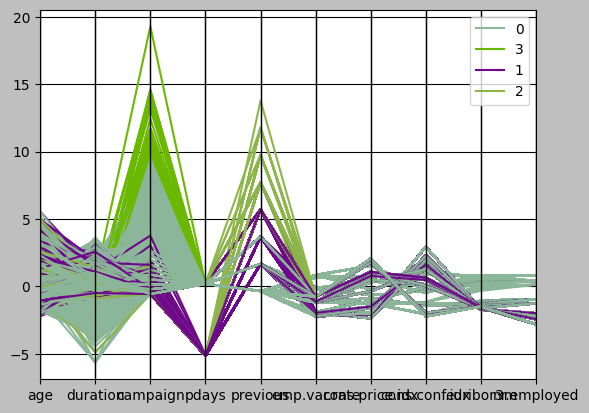

In [318]:
# Scaled data

MMv_s = X_cluster.copy ()
MMv_s ['cluster'] = MS.labels_


from pandas.plotting import parallel_coordinates
# Normalize your dataset if necessary to make the plot more interpretable
parallel_coordinates(MMv_s.assign(cluster=MMv_s['cluster'].astype(str)), 'cluster')
plt.show()

c:\Users\valhk\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


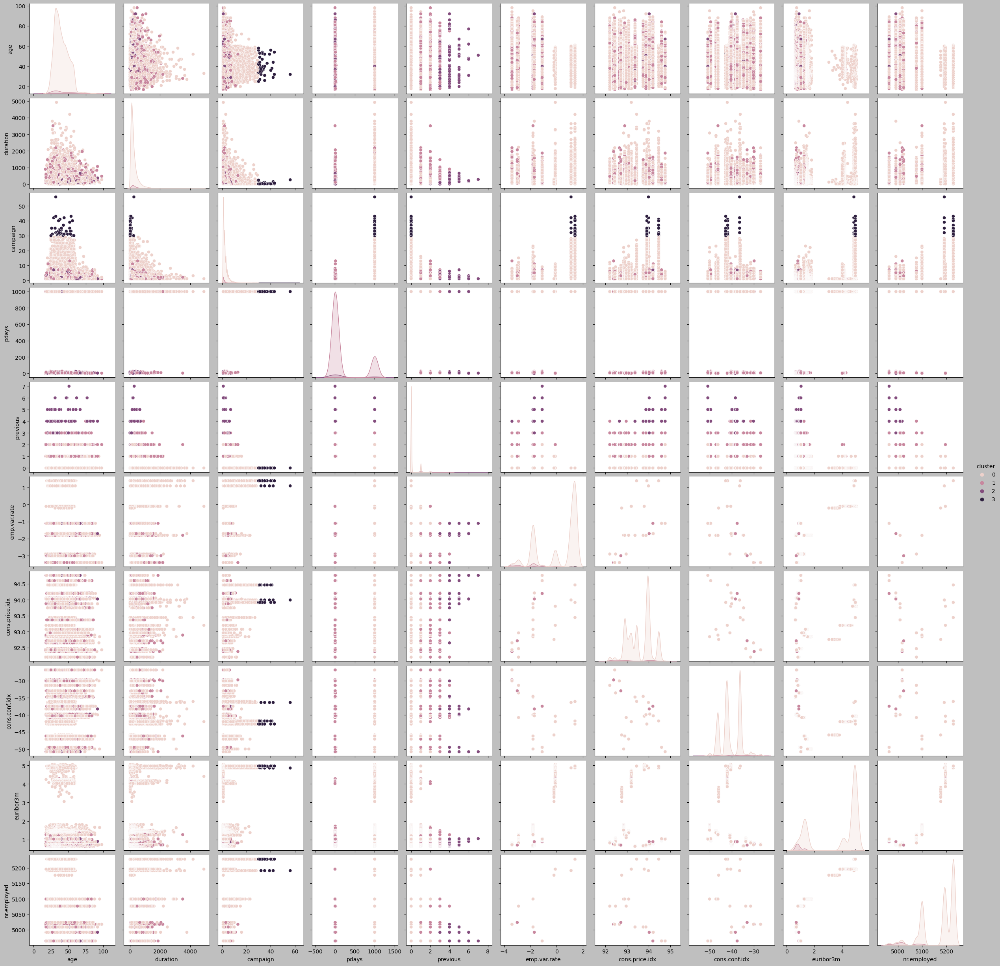

In [319]:
import seaborn as sns
sns.pairplot(MSv, hue='cluster')

In [321]:
used_columns = MMv_s.columns[:-1]
centroids = pd.DataFrame(MS.cluster_centers_, columns=used_columns[:MS.cluster_centers_.shape[1]])

print(centroids)


        age  duration   campaign     pdays  previous  emp.var.rate  \
0  0.011941  0.030659  -0.093352  0.195414 -0.300188      0.656715   
1 -0.243741  0.424331  -0.293815 -5.116555  2.248459     -1.484456   
2 -0.578062 -4.286692  -0.565922 -5.125367  6.722712     -0.943311   
3 -0.769980  0.431124  19.289818  0.195414 -0.349494      0.648092   

   cons.price.idx  cons.conf.idx  euribor3m  nr.employed  
0        0.455289       0.233849   0.689039     0.638127  
1       -0.709024       0.592864  -1.548653    -1.778951  
2        0.928309       0.562342  -1.577923    -2.621927  
3        0.722722       0.886447   0.713036     0.331680  


In [322]:
# print unscaled centroids

centroids_unscaled = pd.DataFrame(scaler.inverse_transform(MS.cluster_centers_), columns=used_columns[:MS.cluster_centers_.shape[1]])

print(centroids_unscaled)

         age  duration   campaign       pdays  previous  emp.var.rate  \
0  40.148499  5.201148   2.309008  999.000000  0.024401      1.113546   
1  37.484009  5.562116   1.753731    6.147122  1.285714     -2.250107   
2  34.000000  1.242453   1.000000    4.500000  3.500000     -1.400000   
3  32.000000  5.568345  56.000000  999.000000  0.000000      1.100000   

   cons.price.idx  cons.conf.idx  euribor3m  nr.employed  
0       93.839201     -39.420312   4.816378  5213.141011  
1       93.165258     -37.758742   0.935267  5038.505544  
2       94.113000     -37.900000   0.884500  4977.600000  
3       93.994000     -36.400000   4.858000  5191.000000  
